# competiton : Binary Prediction with a Rainfall Dataset

## URL : https://www.kaggle.com/competitions/playground-series-s5e3

# importing libraries

In [1]:
# table manipulation, calculating
import pandas as pd
import numpy as np
pd.set_option('display.max_columns', 100) # increase the maximum number of columns

# visualization
import seaborn as sns
import matplotlib.pyplot as plt

# Ignore all warnings
import warnings
warnings.simplefilter("ignore")

# importing datasets

In [2]:
df_train = pd.read_csv('/kaggle/input/playground-series-s5e3/train.csv')
df_test = pd.read_csv('/kaggle/input/playground-series-s5e3/test.csv')

In [3]:
display(df_train)

# 欠損している行を出す。
df_train_nan_index = df_train[df_train.isnull().any(axis=1)].index # 欠損値を含む行のインデックスを保存
df_train_nan_rows = df_train.loc[df_train_nan_index] # 後でインデックスを使用して行を呼び出す
display(df_train_nan_index)
display(df_train_nan_rows)

,id,day,pressure,maxtemp,temparature,mintemp,dewpoint,humidity,cloud,sunshine,winddirection,windspeed,rainfall
0,0,1,1017.4,21.2,20.6,19.9,19.4,87.0,88.0,1.1,60.0,17.2,1
1,1,2,1019.5,16.2,16.9,15.8,15.4,95.0,91.0,0.0,50.0,21.9,1
2,2,3,1024.1,19.4,16.1,14.6,9.3,75.0,47.0,8.3,70.0,18.1,1
3,3,4,1013.4,18.1,17.8,16.9,16.8,95.0,95.0,0.0,60.0,35.6,1
4,4,5,1021.8,21.3,18.4,15.2,9.6,52.0,45.0,3.6,40.0,24.8,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2185,2185,361,1014.6,23.2,20.6,19.1,19.9,97.0,88.0,0.1,40.0,22.1,1
2186,2186,362,1012.4,17.2,17.3,16.3,15.3,91.0,88.0,0.0,50.0,35.3,1
2187,2187,363,1013.3,19.0,16.3,14.3,12.6,79.0,79.0,5.0,40.0,32.9,1
2188,2188,364,1022.3,16.4,15.2,13.8,14.7,92.0,93.0,0.1,40.0,18.0,1


Index([], dtype='int64')

,id,day,pressure,maxtemp,temparature,mintemp,dewpoint,humidity,cloud,sunshine,winddirection,windspeed,rainfall


In [4]:
display(df_test)

# 欠損している行を出す。
df_test_nan_index = df_test[df_test.isnull().any(axis=1)].index # 欠損値を含む行のインデックスを保存
df_test_nan_rows = df_test.loc[df_test_nan_index] # 後でインデックスを使用して行を呼び出す
display(df_test_nan_index)
display(df_test_nan_rows)

,id,day,pressure,maxtemp,temparature,mintemp,dewpoint,humidity,cloud,sunshine,winddirection,windspeed
0,2190,1,1019.5,17.5,15.8,12.7,14.9,96.0,99.0,0.0,50.0,24.3
1,2191,2,1016.5,17.5,16.5,15.8,15.1,97.0,99.0,0.0,50.0,35.3
2,2192,3,1023.9,11.2,10.4,9.4,8.9,86.0,96.0,0.0,40.0,16.9
3,2193,4,1022.9,20.6,17.3,15.2,9.5,75.0,45.0,7.1,20.0,50.6
4,2194,5,1022.2,16.1,13.8,6.4,4.3,68.0,49.0,9.2,20.0,19.4
...,...,...,...,...,...,...,...,...,...,...,...,...
725,2915,361,1020.8,18.2,17.6,16.1,13.7,96.0,95.0,0.0,20.0,34.3
726,2916,362,1011.7,23.2,18.1,16.0,16.0,78.0,80.0,1.6,40.0,25.2
727,2917,363,1022.7,21.0,18.5,17.0,15.5,92.0,96.0,0.0,50.0,21.9
728,2918,364,1014.4,21.0,20.0,19.7,19.8,94.0,93.0,0.0,50.0,39.5


Index([517], dtype='int64')

,id,day,pressure,maxtemp,temparature,mintemp,dewpoint,humidity,cloud,sunshine,winddirection,windspeed
517,2707,153,1007.8,32.9,30.6,28.9,22.0,65.0,75.0,8.2,NaN,17.2


# EDA

## whole

 ### data_inspection

In [5]:
# Check if each column has a unique value of 0 or 1, and assign 1 or 0
def unique_to_binary(column):
    unique_values = column.unique()
    if len(unique_values) == 2 and set(unique_values) == {0, 1}:
        return 1
    else:
        return 0

def find_outliers(df):
    outliers_rate_dict = {}

    for column_name in df.columns:
        column = df[column_name]

        # Skip if not a numeric column
        if not pd.api.types.is_numeric_dtype(column):
            print(f"列 '{column_name}' is skipped because it is not a numeric type.")
            continue

        # Calculate the mean and standard deviation of the data
        mean = column.mean()
        std = column.std()

        # Set outlier threshold
        threshold = 2  # Adjust this value to change the outlier criteria

        # Set conditions for detecting outliers
        lower_bound = mean - threshold * std
        upper_bound = mean + threshold * std

        # Detect outliers
        outliers = (column < lower_bound) | (column > upper_bound)

        # Calculate the percentage of outliers
        outliers_rate = outliers.sum() / len(column)

        # Save results to dictionary
        outliers_rate_dict[column_name] = outliers_rate

    return outliers_rate_dict

In [6]:
def create_data_inspection(df):
    """データフレームのデータ検査情報を生成する関数"""

    # process:1
    data_inspection = pd.DataFrame({
        'column_name': df.columns,
        'data_type': df.dtypes,
        'num_of_rows': len(df),
        'num_of_uniques': df.nunique(),
        'num_of_duplicated_rows': len(df) - df.nunique(),
        'non-null_cnt': df.count().values,
        'null_cnt': df.isnull().sum(),
        'null_rate': (df.isnull().sum() / len(df)),
    })

    # process:2
    description = df.describe().T.reset_index().rename(columns={'index': 'column_name'})
    median = df.median(numeric_only=True).reset_index().rename(columns={'index': 'column_name', 0: 'median'})

    # Calculate the most frequent value for each column
    mode_values = df.mode(numeric_only=True).iloc[0]

    # Calculate the percentage of most frequent values
    mode_ratios = {}
    for column in df.columns:
        if pd.api.types.is_numeric_dtype(df[column]):
            mode_value = mode_values[column]
            mode_ratio = (df[column] == mode_value).sum() / len(df)
            mode_ratios[column] = mode_ratio

    # Convert the most common value and its percentage into a data frame
    mode = mode_values.reset_index().rename(columns={'index': 'column_name', 0: 'mode'})
    mode['rate mode'] = mode['column_name'].map(mode_ratios)

    # process:3
    data_inspection = pd.merge(data_inspection, description, how = 'left', on = 'column_name')
    data_inspection = pd.merge(data_inspection, mode, how = 'left', on = 'column_name')

    outliers_rate = find_outliers(df)
    outliers_rate = pd.DataFrame(list(outliers_rate.items()), columns=['column_name', 'outliers_rate']).reset_index(drop=True)
    data_inspection = pd.merge(data_inspection, outliers_rate, how = 'left', on = 'column_name')

    # ★Add new criteria
    skew = df.skew().reset_index().rename(columns={'index': 'column_name', 0: 'skewness'})
    kurt = df.kurt().reset_index().rename(columns={'index': 'column_name', 0: 'kurtosis'})

    data_inspection = pd.merge(data_inspection, skew, how = 'left', on = 'column_name')
    data_inspection = pd.merge(data_inspection, kurt, how = 'left', on = 'column_name')

    # ★Add new criteria
    # Calculating correlation coefficients (numeric columns only), where errors may occur.
    correlation_matrix = df.corr(numeric_only=True)
    target_corr = pd.DataFrame({'column_name': correlation_matrix.columns, 'target correlation': correlation_matrix.iloc[:, -1]})

    data_inspection = pd.merge(data_inspection, target_corr, how = 'left', on = 'column_name')

    # process:4
    data_inspection_else = pd.DataFrame({
        'column_name': df.columns,
        'flag_or_not': df.apply(unique_to_binary),
        'columns_details': None,
        'remarks': None,
        'trigger': None,
        'dataset_name': None,
        'existence_of_table_definition': None,
        # 'data_exmaple': df.head(1).T[0] # or df.dropna().T.iloc[0]
        'data_exmaple': df.head(1).T.iloc[:, 0]
    })

    data_inspection = pd.merge(data_inspection, data_inspection_else, how = 'left', on = 'column_name')

    # visualization `data_inspection`
    # blue → green → yellow
    data_inspection_styled = data_inspection.style.background_gradient(cmap='viridis', subset=pd.IndexSlice[:, data_inspection.select_dtypes(include=['number']).columns])

    return data_inspection_styled

### df_train

In [7]:
data_inspection_styled = create_data_inspection(df_train)
display(data_inspection_styled)
# data_inspection.to_csv('data_inspection.csv', index = 'false')

,column_name,data_type,num_of_rows,num_of_uniques,num_of_duplicated_rows,non-null_cnt,null_cnt,null_rate,count,mean,std,min,25%,50%,75%,max,mode,rate mode,outliers_rate,skewness,kurtosis,target correlation,flag_or_not,columns_details,remarks,trigger,dataset_name,existence_of_table_definition,data_exmaple
0,id,int64,2190,2190,0,2190,0,0.000000,2190.000000,1094.500000,632.342866,0.000000,547.250000,1094.500000,1641.750000,2189.000000,0.000000,0.000457,0.000000,0.000000,-1.200000,0.033674,0,None,None,None,None,None,0.000000
1,day,int64,2190,365,1825,2190,0,0.000000,2190.000000,179.948402,105.203592,1.000000,89.000000,178.500000,270.000000,365.000000,3.000000,0.003196,0.000000,0.030615,-1.193005,-0.000462,0,None,None,None,None,None,1.000000
2,pressure,float64,2190,236,1954,2190,0,0.000000,2190.000000,1013.602146,5.655366,999.000000,1008.600000,1013.000000,1017.775000,1034.600000,1008.100000,0.029224,0.028311,0.284062,-0.502999,-0.049886,0,None,None,None,None,None,1017.400000
3,maxtemp,float64,2190,219,1971,2190,0,0.000000,2190.000000,26.365799,5.654330,10.400000,21.300000,27.800000,31.200000,36.000000,31.000000,0.019635,0.013699,-0.490890,-0.907045,-0.079304,0,None,None,None,None,None,21.200000
4,temparature,float64,2190,198,1992,2190,0,0.000000,2190.000000,23.953059,5.222410,7.400000,19.300000,25.500000,28.400000,31.500000,30.100000,0.025114,0.025571,-0.557471,-0.835119,-0.049660,0,None,None,None,None,None,20.600000
5,mintemp,float64,2190,199,1991,2190,0,0.000000,2190.000000,22.170091,5.059120,4.000000,17.700000,23.850000,26.400000,29.800000,26.800000,0.023744,0.037900,-0.649179,-0.608251,-0.026841,0,None,None,None,None,None,19.900000
6,dewpoint,float64,2190,218,1972,2190,0,0.000000,2190.000000,20.454566,5.288406,-0.300000,16.800000,22.150000,25.000000,26.700000,25.400000,0.031963,0.041553,-0.997889,0.418278,0.081965,0,None,None,None,None,None,19.400000
7,humidity,float64,2190,49,2141,2190,0,0.000000,2190.000000,82.036530,7.800654,39.000000,77.000000,82.000000,88.000000,98.000000,79.000000,0.087671,0.034703,-0.561541,1.399138,0.454213,0,None,None,None,None,None,87.000000
8,cloud,float64,2190,78,2112,2190,0,0.000000,2190.000000,75.721918,18.026498,2.000000,69.000000,83.000000,88.000000,100.000000,88.000000,0.171233,0.053881,-1.339274,1.053899,0.641191,0,None,None,None,None,None,88.000000
9,sunshine,float64,2190,120,2070,2190,0,0.000000,2190.000000,3.744429,3.626327,0.000000,0.400000,2.400000,6.800000,12.100000,0.000000,0.153881,0.021461,0.639871,-1.016200,-0.555287,0,None,None,None,None,None,1.100000


### df_test

In [8]:
data_inspection_styled = create_data_inspection(df_test)
display(data_inspection_styled)
# data_inspection.to_csv('data_inspection.csv', index = 'false')

,column_name,data_type,num_of_rows,num_of_uniques,num_of_duplicated_rows,non-null_cnt,null_cnt,null_rate,count,mean,std,min,25%,50%,75%,max,mode,rate mode,outliers_rate,skewness,kurtosis,target correlation,flag_or_not,columns_details,remarks,trigger,dataset_name,existence_of_table_definition,data_exmaple
0,id,int64,730,730,0,730,0,0.000000,730.000000,2554.500000,210.877136,2190.000000,2372.250000,2554.500000,2736.750000,2919.000000,2190.000000,0.001370,0.000000,0.000000,-1.200000,0.011051,0,None,None,None,None,None,2190.000000
1,day,int64,730,365,365,730,0,0.000000,730.000000,183.000000,105.438271,1.000000,92.000000,183.000000,274.000000,365.000000,1.000000,0.002740,0.000000,0.000000,-1.200014,-0.002584,0,None,None,None,None,None,1.000000
2,pressure,float64,730,185,545,730,0,0.000000,730.000000,1013.503014,5.505871,1000.000000,1008.725000,1012.700000,1017.600000,1032.200000,1008.100000,0.031507,0.032877,0.346092,-0.545378,0.217307,0,None,None,None,None,None,1019.500000
3,maxtemp,float64,730,182,548,730,0,0.000000,730.000000,26.372466,5.672521,7.400000,21.600000,27.800000,31.000000,35.800000,31.000000,0.034247,0.013699,-0.540928,-0.786611,-0.290388,0,None,None,None,None,None,17.500000
4,temparature,float64,730,175,555,730,0,0.000000,730.000000,23.963288,5.278098,5.900000,19.825000,25.650000,28.375000,31.800000,25.800000,0.021918,0.030137,-0.608443,-0.727989,-0.266677,0,None,None,None,None,None,15.800000
5,mintemp,float64,730,171,559,730,0,0.000000,730.000000,22.110274,5.170744,4.200000,17.825000,23.900000,26.400000,29.100000,24.800000,0.026027,0.041096,-0.666483,-0.588222,-0.250437,0,None,None,None,None,None,12.700000
6,dewpoint,float64,730,172,558,730,0,0.000000,730.000000,20.460137,5.391169,-0.000000,16.800000,22.300000,25.000000,26.700000,25.300000,0.046575,0.039726,-1.078338,0.646597,-0.239695,0,None,None,None,None,None,14.900000
7,humidity,float64,730,42,688,730,0,0.000000,730.000000,82.669863,7.818714,39.000000,77.250000,82.000000,89.000000,98.000000,79.000000,0.083562,0.021918,-0.579530,1.857808,0.075676,0,None,None,None,None,None,96.000000
8,cloud,float64,730,69,661,730,0,0.000000,730.000000,76.360274,17.934121,0.000000,69.000000,83.000000,88.000000,100.000000,88.000000,0.183562,0.054795,-1.324879,1.125292,0.182042,0,None,None,None,None,None,99.000000
9,sunshine,float64,730,110,620,730,0,0.000000,730.000000,3.664384,3.639272,0.000000,0.325000,2.200000,6.675000,11.800000,0.000000,0.167123,0.020548,0.681320,-0.973919,-0.213461,0,None,None,None,None,None,0.000000


### Visualizing missing values

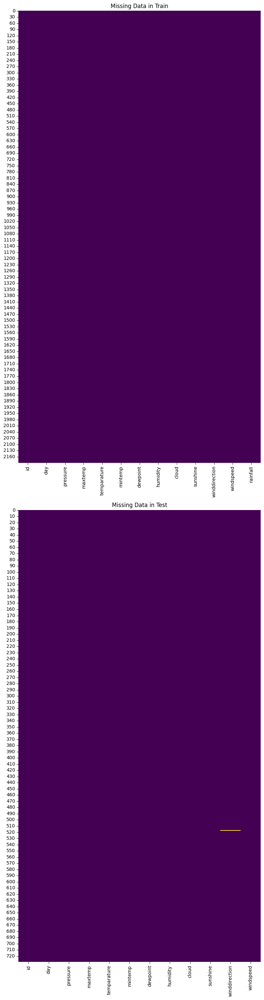

In [9]:
# Create a 1-by-2 subplot
fig, axes = plt.subplots(2, 1, figsize=(8, 30))

# Missing value heatmap of training data
sns.heatmap(df_train.isnull(), cbar=False, cmap='viridis', ax=axes[0])
axes[0].set_title('Missing Data in Train')

# Missing value heatmap for test data
sns.heatmap(df_test.isnull(), cbar=False, cmap='viridis', ax=axes[1])
axes[1].set_title('Missing Data in Test')

# Adjust layout
plt.tight_layout()
plt.show()

## univariate

### numeric

In [10]:
# # EDA for both of numeric and category
# # custom palette of colors
# custom_palette = ['#3498db', '#e74c3c','#2ecc71']

# # Create a list of variables (both numerical and categorical data)
# numerical_variables = df_train.select_dtypes(include=['number']).columns
# categorical_variables = df_train.select_dtypes(include=['object']).columns

# # A function to create plots for each variable
# def create_variable_plots(variable, data_type='numerical'):
#     sns.set_style('whitegrid')
    
#     # For numeric data
#     if data_type == 'numerical':
#         fig, axes = plt.subplots(1, 2, figsize=(12, 4))

#         # Box plot
#         plt.subplot(1, 2, 1)
#         sns.boxplot(data=pd.concat([df_train, df_test]), x=variable, y="dataset", palette=custom_palette)
#         plt.xlabel(variable)
#         plt.title(f"Box plot for {variable}")

#         # histgram
#         plt.subplot(1, 2, 2)
#         sns.histplot(data=df_train, x=variable, color=custom_palette[0], kde=True, bins=30, label="train")
#         if variable in df_test.columns:
#             sns.histplot(data=df_test, x=variable, color=custom_palette[1], kde=True, bins=30, label="test")
        
#         plt.xlabel(variable)
#         plt.ylabel("Frequency")
#         plt.title(f"Histogram for {variable} [train & test]" if variable in df_test.columns else f"Histogram for {variable} [train]")
#         plt.legend()

#     # For categorical data
#     elif data_type == 'categorical':
#         fig, axes = plt.subplots(1, 2, figsize=(12, 4))

#         # pie chart
#         plt.subplot(1, 2, 1)
#         gender_counts = pd.concat([df_train[variable], df_test[variable]]).value_counts(normalize=True)
#         gender_counts.plot(kind='pie', autopct='%1.1f%%', colors=custom_palette, startangle=90, ax=plt.gca())
#         plt.title(f"Pie chart for {variable}")

#         # countplat
#         plt.subplot(1, 2, 2)
#         sns.countplot(data=pd.concat([df_train, df_test]), x=variable, hue="dataset", palette=custom_palette)
#         plt.title(f"Count plot for {variable}")

#     plt.tight_layout()
#     plt.show()

# # Create plots for numerical data
# for variable in numerical_variables:
#     create_variable_plots(variable, data_type='numerical')

# # Create plots for categorical data
# for variable in categorical_variables:
#     create_variable_plots(variable, data_type='categorical')


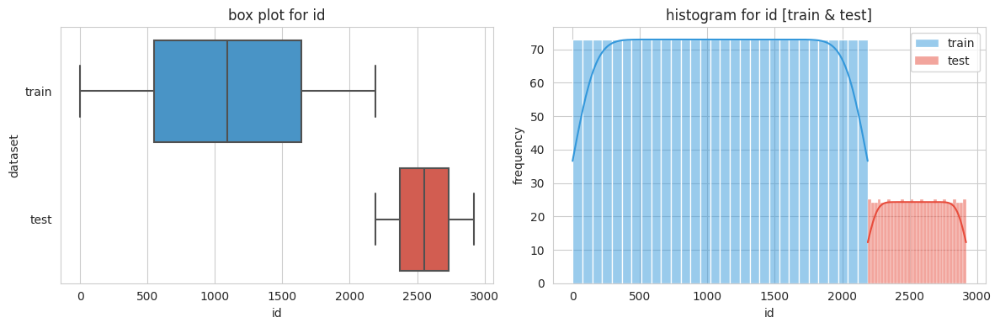

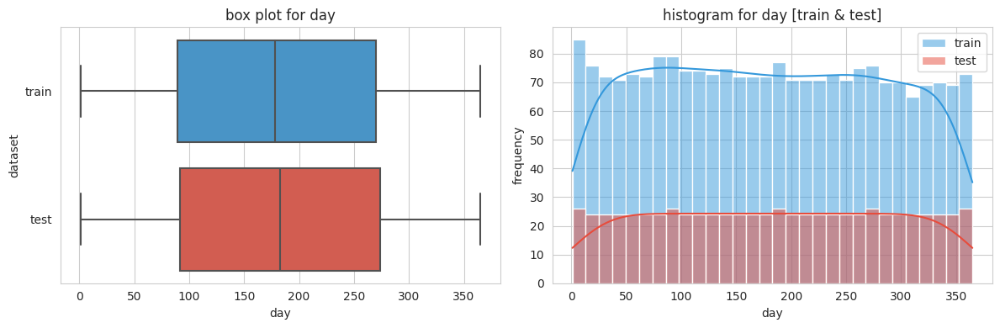

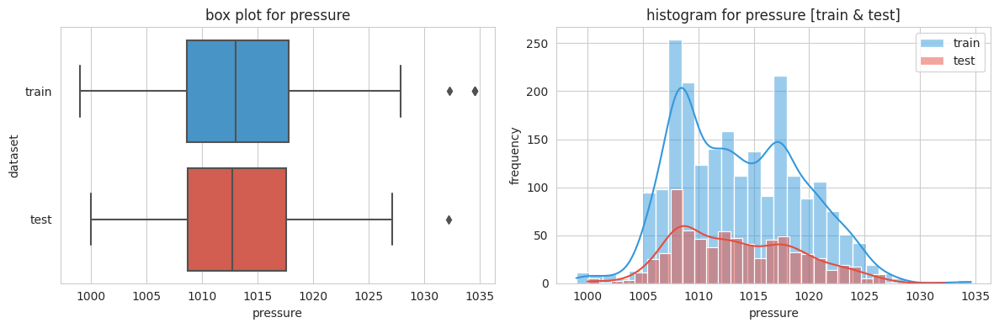

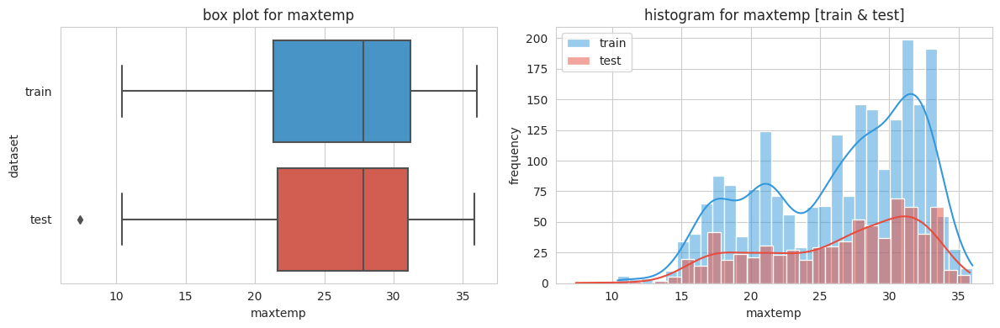

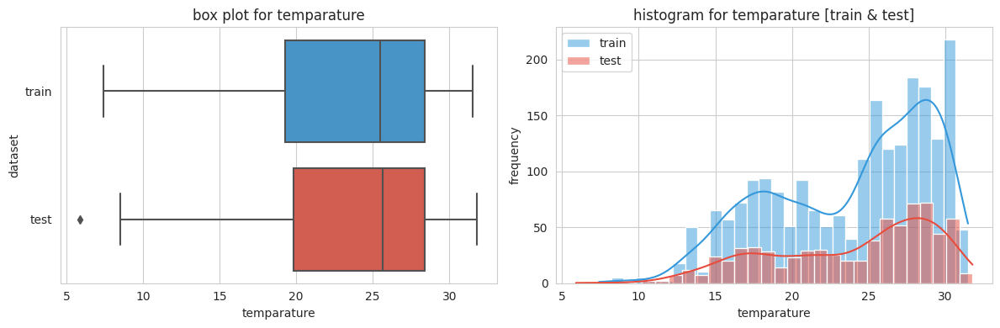

...

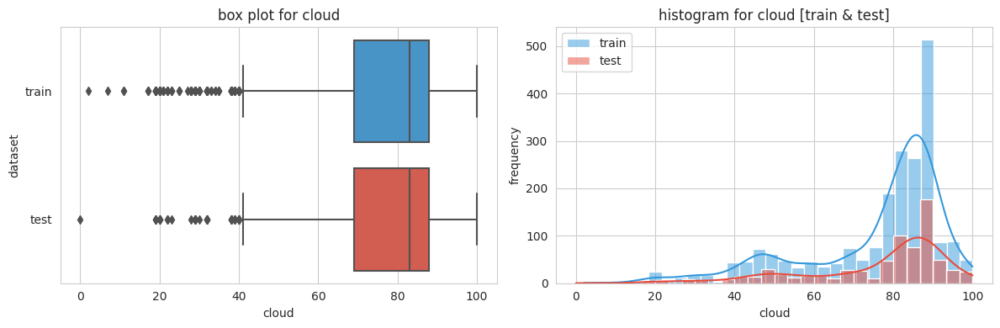

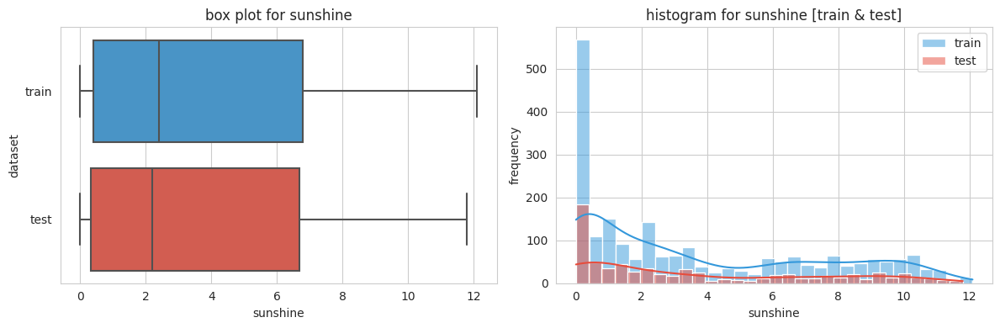

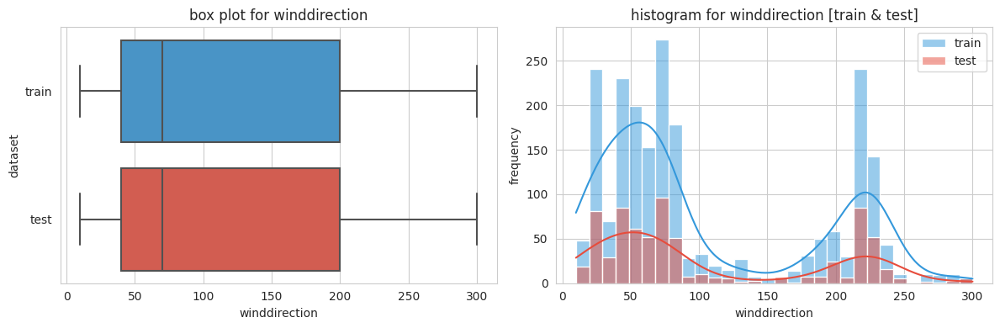

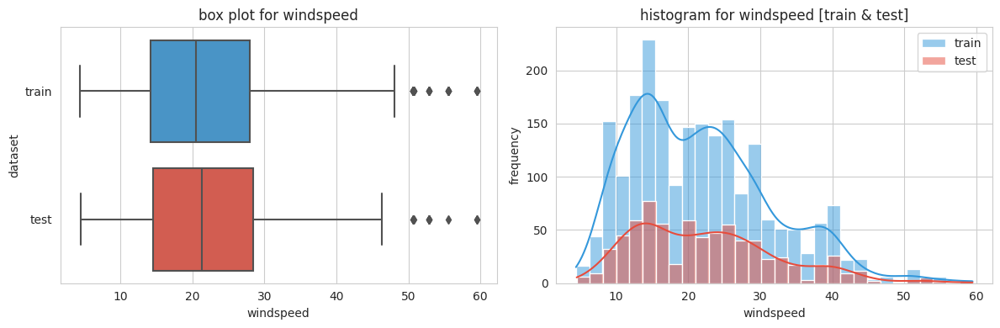

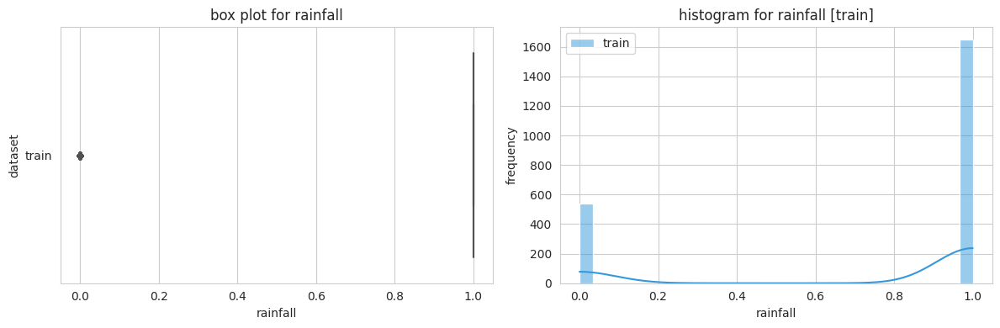

In [11]:
# box plot and histogram

# Define a custom color palette
custom_palette = ['#3498db', '#e74c3c','#2ecc71']

# Add 'Dataset' column to distinguish between train and test data
df_train['dataset'] = 'train'
df_test['dataset'] = 'test'

# Get only numeric variables
numerical_variables = df_train.select_dtypes(include=['number']).columns

# Function to create and display a row of plots for a single variable
def create_variable_plots(variable):
    sns.set_style('whitegrid')
    
    # Check if variable exists in both df_train and df_test
    if variable in df_train.columns:
        fig, axes = plt.subplots(1, 2, figsize=(12, 4))

        # Box plot
        plt.subplot(1, 2, 1)
        if variable in df_test.columns:
            sns.boxplot(data=pd.concat([df_train, df_test]), x=variable, y="dataset", palette=custom_palette)
        else:
            sns.boxplot(data=df_train, x=variable, y="dataset", palette=custom_palette)
        plt.xlabel(variable)
        plt.title(f"box plot for {variable}")

        # Separate Histograms
        plt.subplot(1, 2, 2)
        sns.histplot(data=df_train, x=variable, color=custom_palette[0], kde=True, bins=30, label="train")
        if variable in df_test.columns:
            sns.histplot(data=df_test, x=variable, color=custom_palette[1], kde=True, bins=30, label="test")
        
        plt.xlabel(variable)
        plt.ylabel("frequency")
        plt.title(f"histogram for {variable} [train & test]" if variable in df_test.columns else f"histogram for {variable} [train]")
        plt.legend()

        # Adjust spacing between subplots
        plt.tight_layout()

        # Show the plots
        plt.show()

# Perform univariate analysis for each variable
for variable in numerical_variables:
    create_variable_plots(variable)

# delete unnecessary column
del df_train['dataset']
del df_test['dataset']

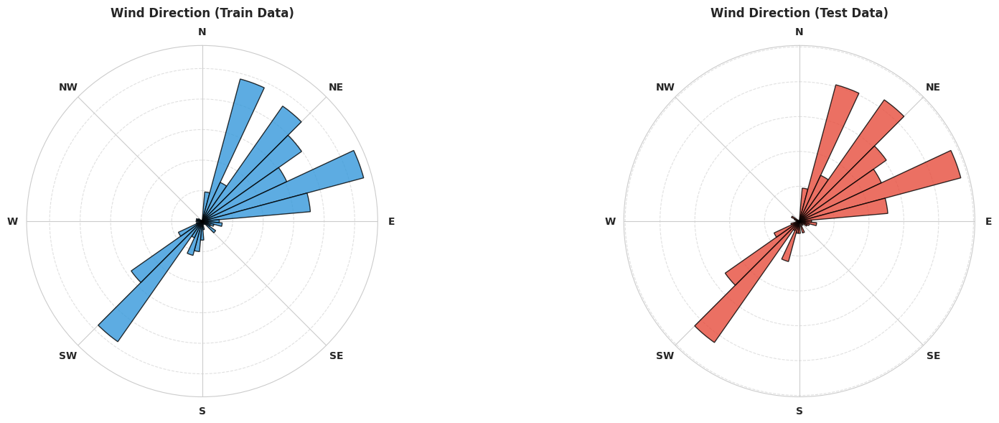

In [12]:
# Define custom color palette for Train, Test, and Original datasets
custom_palette = ['#3498db', '#e74c3c', '#2ecc71']  # Blue, Red, Green

# Function to create Wind Rose plot in a subplot
def create_wind_rose(ax, data, dataset_name, color):
    # Convert wind direction to radians
    wind_direction_radians = np.radians(data['winddirection'].dropna())

    # Create histogram bins (every 10°)
    bins = np.linspace(0, 2*np.pi, 37)  # 36 bins (every 10°)
    counts, bin_edges = np.histogram(wind_direction_radians, bins=bins)

    # Plot on the polar axis with improved style
    bars = ax.bar(bin_edges[:-1], counts, width=np.radians(10), color=color, edgecolor='black', alpha=0.8)

    # Formatting for professional appearance
    ax.set_theta_zero_location("N")  # North is at 0°
    ax.set_theta_direction(-1)  # Clockwise
    ax.set_xticks(np.radians(np.arange(0, 360, 45)))  # Tick labels every 45°
    ax.set_xticklabels(['N', 'NE', 'E', 'SE', 'S', 'SW', 'W', 'NW'], fontsize=10, fontweight='bold')

    # Add grid and labels for better readability
    ax.yaxis.grid(True, linestyle="--", alpha=0.6)
    ax.set_yticklabels([])  # Remove radial labels to avoid clutter
    ax.set_title(f"Wind Direction ({dataset_name})", fontsize=12, fontweight='bold', pad=10)

# Create a single row with three wind rose plots
fig, axes = plt.subplots(1, 2, figsize=(18, 6), subplot_kw={'projection': 'polar'})

# Generate wind rose plots for Train, Test, and Original datasets
create_wind_rose(axes[0], df_train, "Train Data", custom_palette[0])  # Blue
create_wind_rose(axes[1], df_test, "Test Data", custom_palette[1])    # Red

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

### caterogy

## vivariate

### numeric

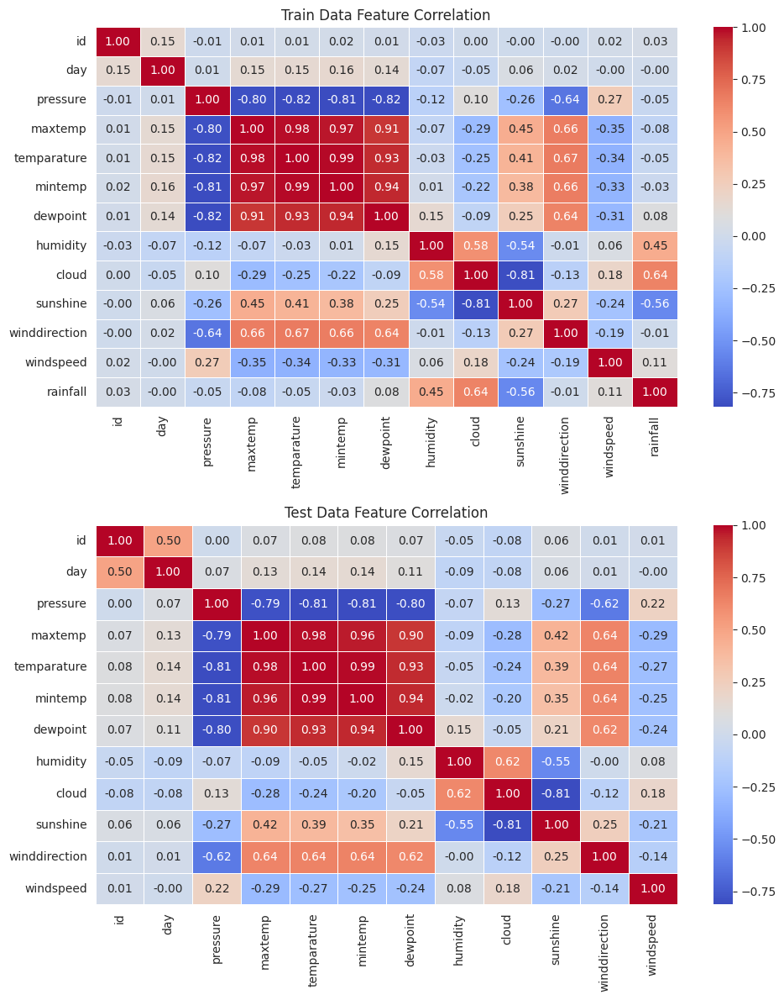

In [13]:
# Create a subplot (1 column, 2 rows)
fig, axes = plt.subplots(2, 1, figsize=(10, 12))

# Correlation matrix of df_train
# (if necessary, extract only highly correlated variables.ex：mask=(corr < 0.8)))
sns.heatmap(df_train[numerical_variables].corr(), annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, ax=axes[0])
axes[0].set_title('Train Data Feature Correlation')

# # Correlation matrix of df_test
# (if necessary, extract only highly correlated variables.ex：mask=(corr < 0.8)))
sns.heatmap(df_test.corr(), annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, ax=axes[1])
axes[1].set_title('Test Data Feature Correlation')

# Layout adjustment
plt.tight_layout()
plt.show()

Pairplot of Train Data


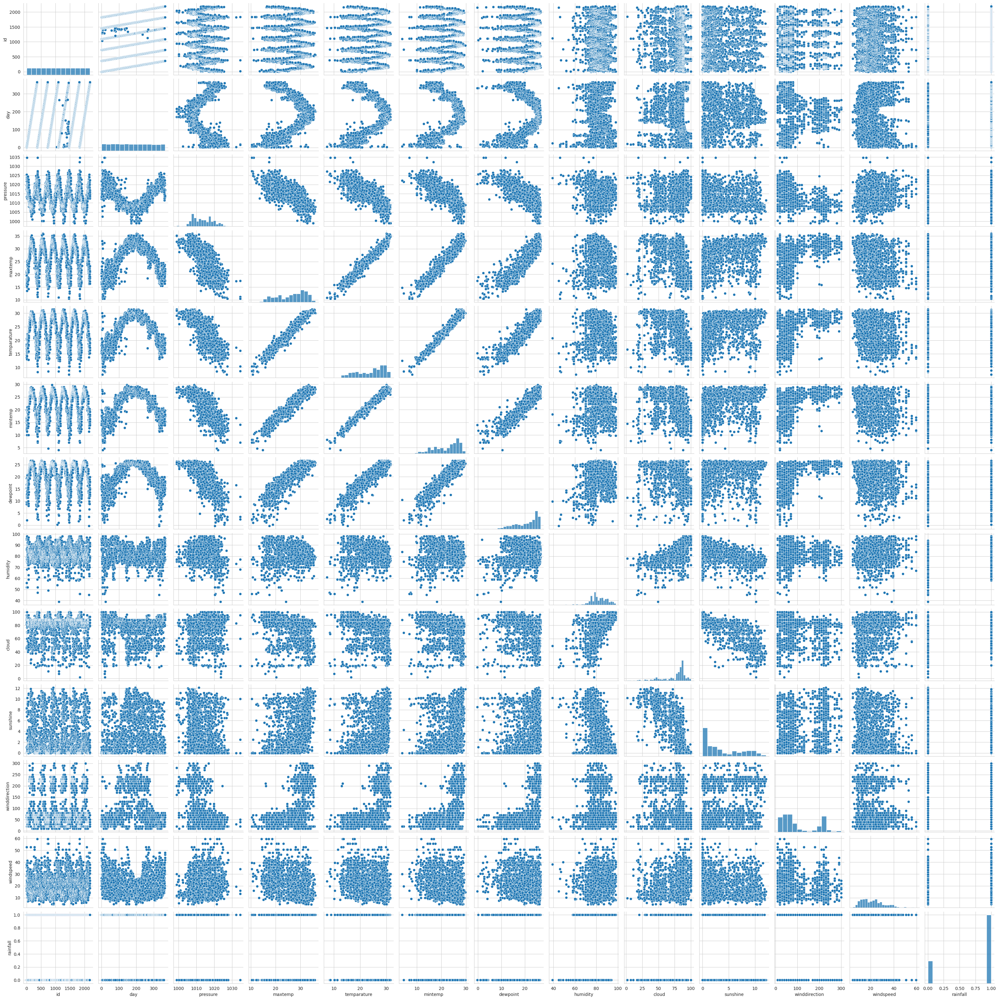

------------------------------------------------------------------------------------------------------
Pairplot of Test Data


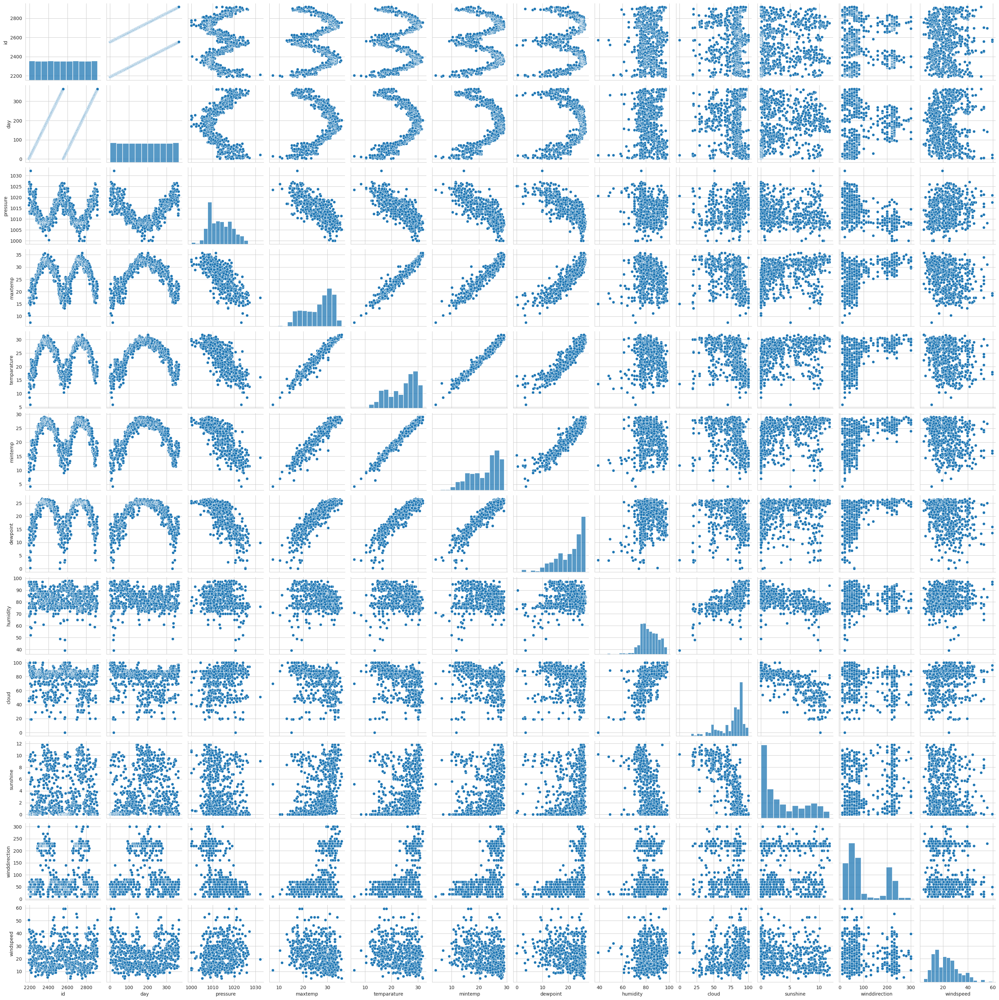

In [14]:
# pairplot を作成
print('Pairplot of Train Data')
sns.pairplot(df_train)
plt.show()

print('------------------------------------------------------------------------------------------------------')

print('Pairplot of Test Data')
sns.pairplot(df_test)
plt.show()

### category

In [15]:
# # Cross-tabulation table (combination of category 1 and category 2)
# contingency_table = pd.crosstab(df_test['category1'], df_test['category2'])

# # Heatmap drawing
# plt.figure(figsize=(8, 6))
# sns.heatmap(contingency_table, annot=True, fmt='d', cmap='Blues', cbar=False)
# plt.title('Contingency Table Heatmap')
# plt.show()

## time_series

In [16]:
# from statsmodels.tsa.seasonal import seasonal_decompose

# # 時系列データを設定（'date'をインデックスにして'sales'をターゲット）
# ts = df.set_index('date')['sales']

# # 時系列の分解（加法モデルで分解、周期は365日と仮定）
# decomposition = seasonal_decompose(ts, model='additive', period=365)

# # 分解結果から各成分を取得
# trend_component = decomposition.trend
# seasonal_component = decomposition.seasonal
# residual_component = decomposition.resid

# # トレンド + 季節性 + ノイズを合成
# reconstructed_series = trend_component + seasonal_component + residual_component

# # 4行に分けてプロットを作成
# plt.figure(figsize=(10, 12))

# # 1行目：再構成された時系列（トレンド + 季節性 + 残差）
# plt.subplot(4, 1, 1)
# plt.plot(reconstructed_series, label='Reconstructed Series (Trend + Seasonal + Residual)')
# plt.title('Reconstructed Time Series (Trend + Seasonal + Residual)')

# # 2行目：トレンド成分
# plt.subplot(4, 1, 2)
# plt.plot(trend_component)
# plt.title('Trend Component')

# # 3行目：季節性成分
# plt.subplot(4, 1, 3)
# plt.plot(seasonal_component)
# plt.title('Seasonal Component')

# # 4行目：残差成分
# plt.subplot(4, 1, 4)
# plt.plot(residual_component)
# plt.title('Residual (Noise) Component')

# # レイアウトの調整
# plt.tight_layout()
# plt.show()

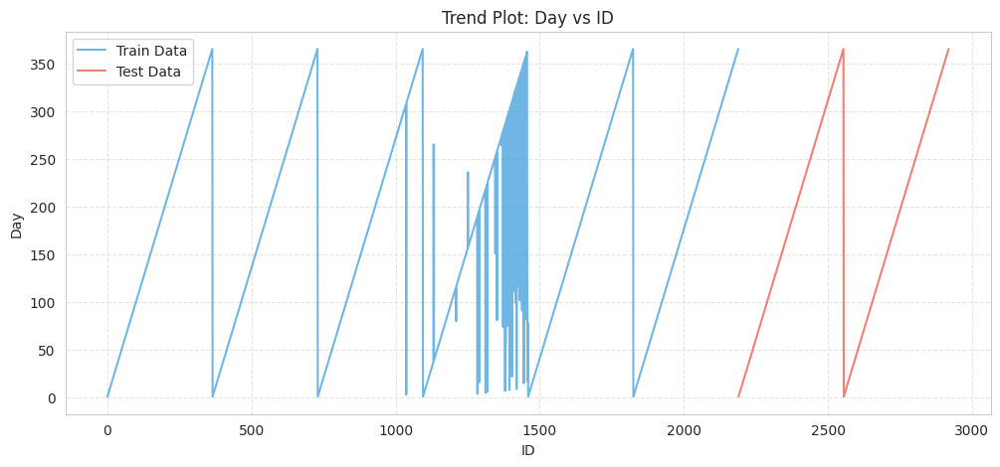

In [17]:
# Define colors for Train and Test data
train_color = '#3498db'  # Blue
test_color = '#e74c3c'   # Red

# Create the plot
plt.figure(figsize=(12, 5))

# Plot Train Data
plt.plot(df_train['id'], df_train['day'], linestyle='-', color=train_color, label='Train Data', alpha=0.7)

# Plot Test Data
plt.plot(df_test['id'], df_test['day'], linestyle='-', color=test_color, label='Test Data', alpha=0.7)

# Formatting
plt.xlabel('ID')
plt.ylabel('Day')
plt.title('Trend Plot: Day vs ID')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)

# Show plot
plt.show()

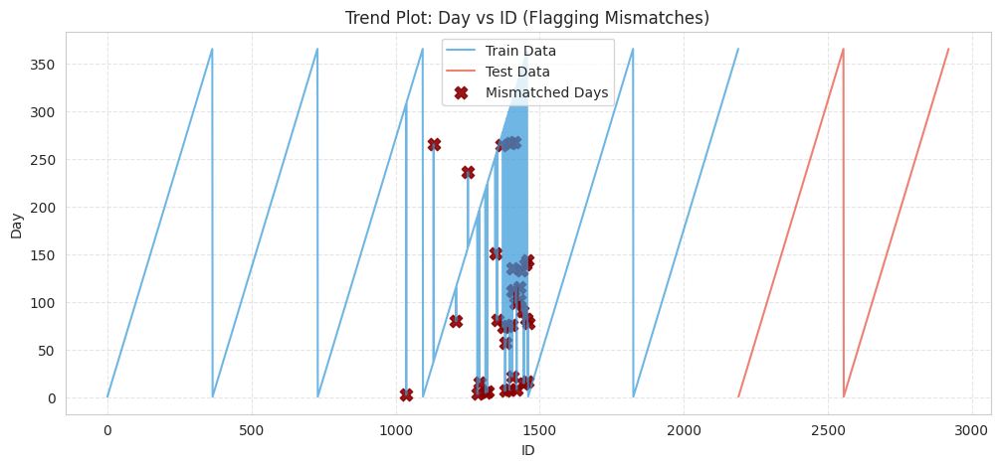

In [18]:
# Generate the expected repeating pattern (1-365 for 6 years)
expected_pattern = np.tile(np.arange(1, 366), 6)  # Repeats 1-365 exactly 6 times

# Check for incorrect labels
df_train['expected_day'] = expected_pattern[:len(df_train)]  # Assign expected pattern
df_train['day_mismatch'] = df_train['day'] != df_train['expected_day']  # Flag mismatches

flag_color = '#8B0000'   # Dark Red (for mismatched days)

# Generate expected repeating pattern (1-365 for 6 years)
expected_pattern = np.tile(np.arange(1, 366), 6)  # Repeats 1-365 exactly 6 times

# Assign expected pattern and flag mismatches
df_train['expected_day'] = expected_pattern[:len(df_train)]
df_train['day_mismatch'] = df_train['day'] != df_train['expected_day']  # Boolean flag

# Create the plot
plt.figure(figsize=(12, 5))

# Plot Train Data
plt.plot(df_train['id'], df_train['day'], linestyle='-', color=train_color, label='Train Data', alpha=0.7)

# Plot Test Data
plt.plot(df_test['id'], df_test['day'], linestyle='-', color=test_color, label='Test Data', alpha=0.7)

# Flag mismatched days using red markers
plt.scatter(
    df_train.loc[df_train['day_mismatch'], 'id'],  # X-axis: IDs of mismatched days
    df_train.loc[df_train['day_mismatch'], 'day'], # Y-axis: Corresponding incorrect days
    color=flag_color, marker='X', s=80, label='Mismatched Days', alpha=0.9
)

# Formatting
plt.xlabel('ID')
plt.ylabel('Day')
plt.title('Trend Plot: Day vs ID (Flagging Mismatches)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)

# Show plot
plt.show()

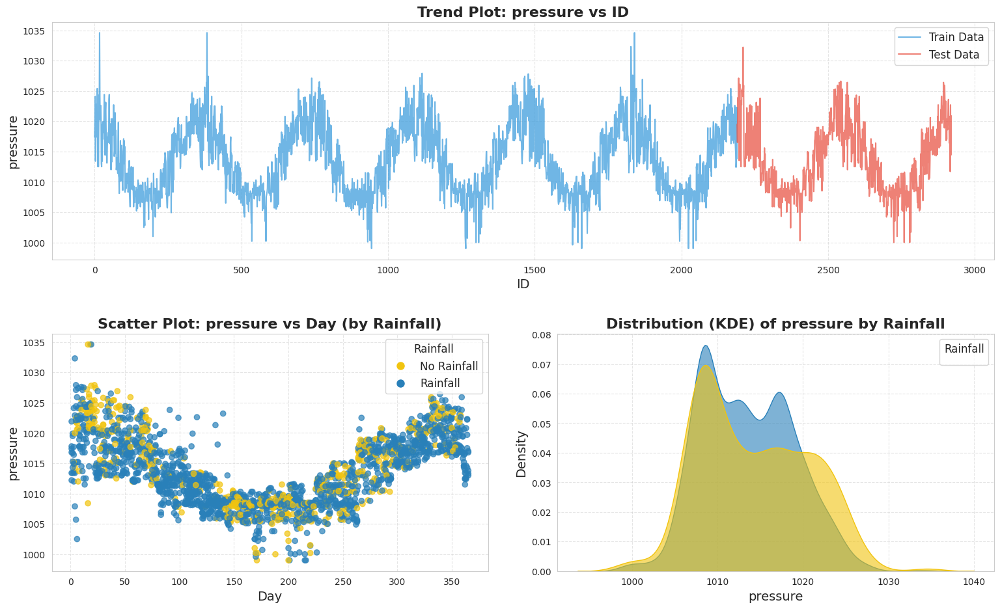

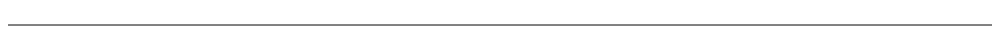

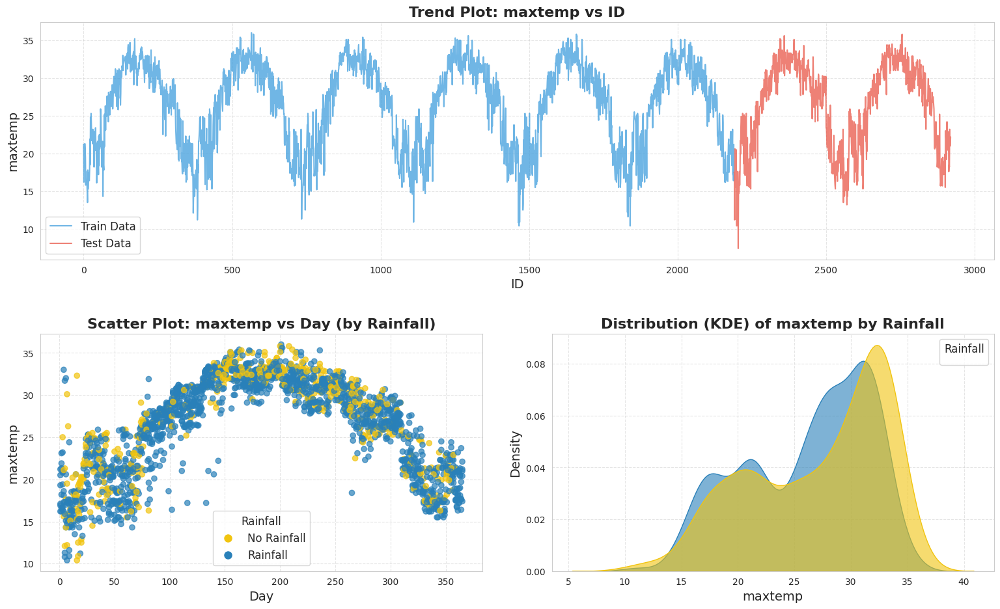

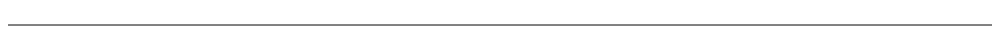

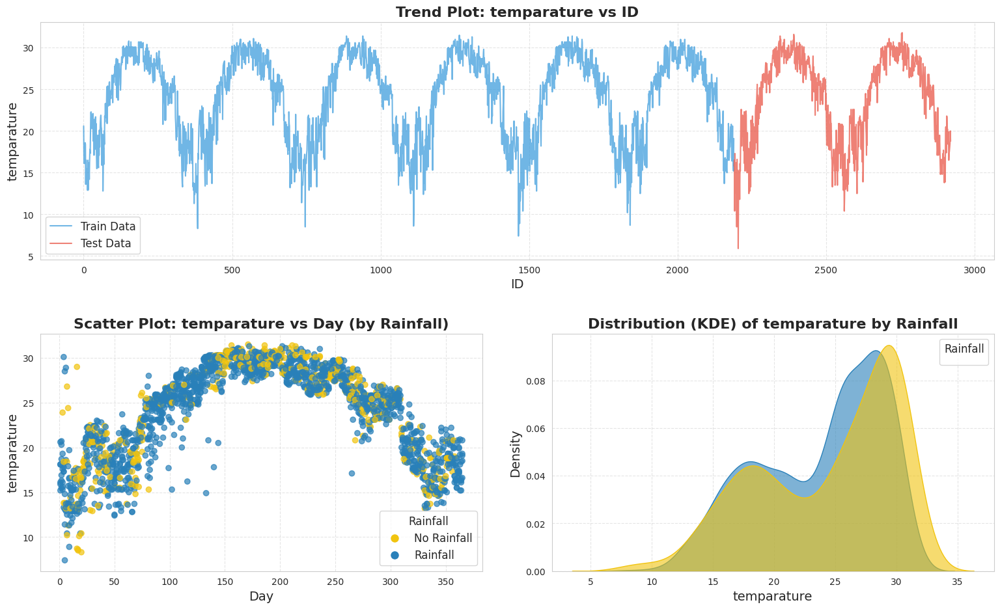

...

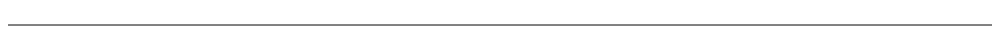

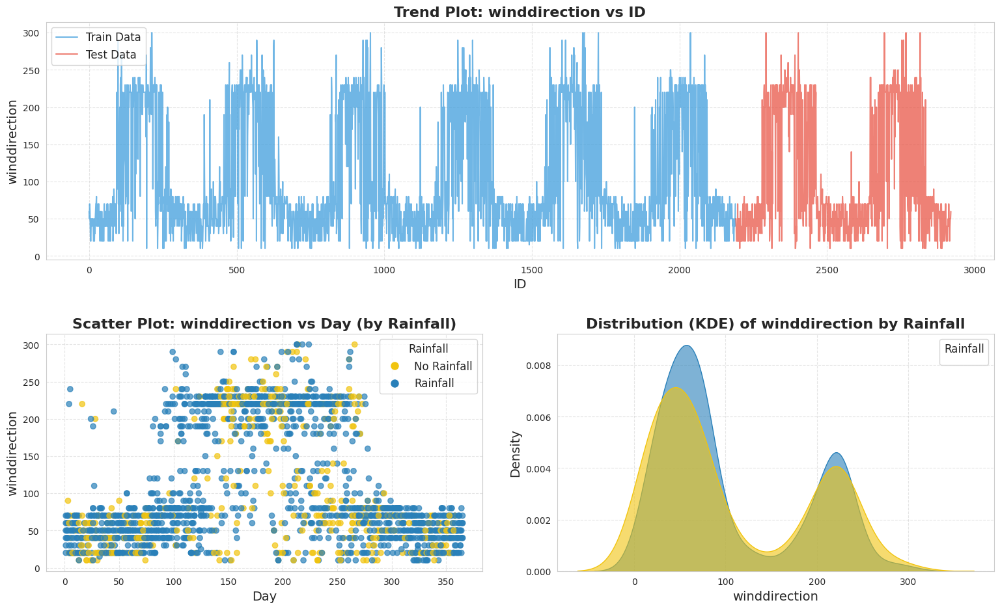

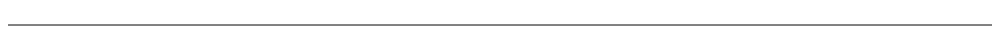

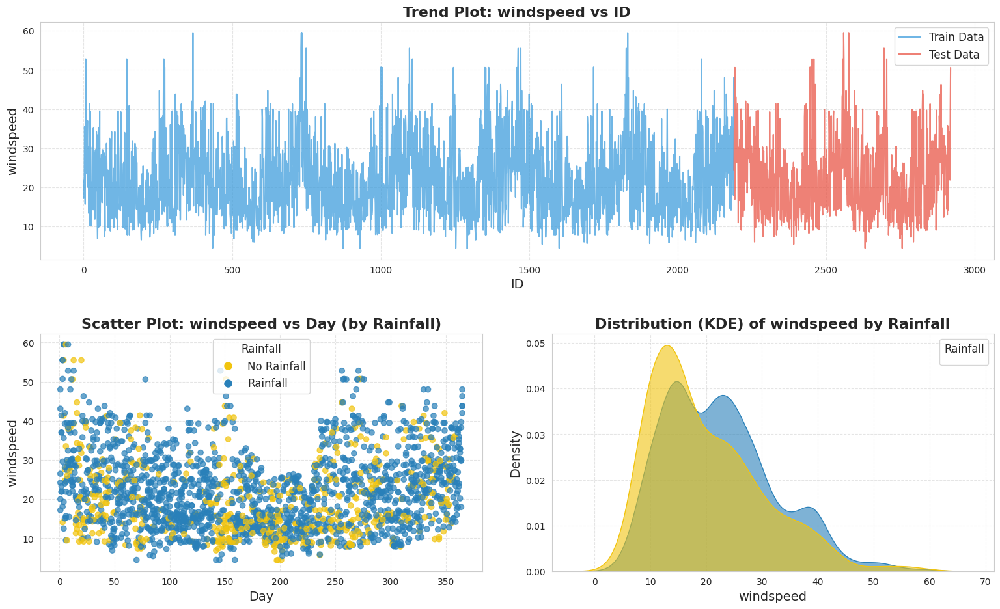

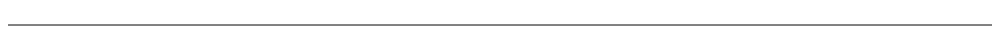

In [19]:
# Define colors
train_color = '#3498db'  # Blue
test_color = '#e74c3c'   # Red
rainfall_colors = {0: '#f1c40f', 1: '#2980b9'}  # Dark Yellow (no rainfall), Blue (rainfall)

# Numerical columns to plot
numerical_columns = df_test.select_dtypes(include=['int64', 'float64']).columns.tolist()
for col in ['id', 'day', 'rainfall']:
    if col in numerical_columns:
        numerical_columns.remove(col)

# Plotting loop for each numerical variable
for column in numerical_columns:
    # Create figure with specific layout
    fig = plt.figure(figsize=(16, 10))
    gs = fig.add_gridspec(2, 2, height_ratios=[1, 1])

    # ---- Trend Plot (ID vs Variable) ----
    ax0 = fig.add_subplot(gs[0, :])
    ax0.plot(df_train['id'], df_train[column], linestyle='-', color=train_color, label='Train Data', alpha=0.7)
    ax0.plot(df_test['id'], df_test[column], linestyle='-', color=test_color, label='Test Data', alpha=0.7)

    ax0.set_xlabel('ID', fontsize=14)
    ax0.set_ylabel(column, fontsize=14)
    ax0.set_title(f'Trend Plot: {column} vs ID', fontsize=16, fontweight='bold')  # ✅ Fix applied
    ax0.legend(fontsize=12)
    ax0.grid(True, linestyle='--', alpha=0.5)

    # ---- Scatter Plot (Day vs Variable) ----
    ax1 = fig.add_subplot(gs[1, 0])
    scatter = ax1.scatter(
        df_train['day'], df_train[column],
        c=df_train['rainfall'].map(rainfall_colors), alpha=0.7
    )
    ax1.set_xlabel('Day', fontsize=14)
    ax1.set_ylabel(column, fontsize=14)
    ax1.set_title(f'Scatter Plot: {column} vs Day (by Rainfall)', fontsize=16, fontweight='bold')  # ✅ Fix applied

    # Custom legend for rainfall
    from matplotlib.lines import Line2D
    legend_elements = [
        Line2D([0], [0], marker='o', color='w', label='No Rainfall',
               markersize=10, markerfacecolor=rainfall_colors[0]),
        Line2D([0], [0], marker='o', color='w', label='Rainfall',
               markersize=10, markerfacecolor=rainfall_colors[1])
    ]
    ax1.legend(handles=legend_elements, title="Rainfall", fontsize=12, title_fontsize=12)
    ax1.grid(True, linestyle='--', alpha=0.5)

    # ---- KDE Plot (Variable distribution by Rainfall) ----
    ax2 = fig.add_subplot(gs[1, 1])
    sns.kdeplot(data=df_train, x=column, hue='rainfall', palette=rainfall_colors, ax=ax2, fill=True, common_norm=False, alpha=0.6)

    ax2.set_xlabel(column, fontsize=14)
    ax2.set_ylabel('Density', fontsize=14)
    ax2.set_title(f'Distribution (KDE) of {column} by Rainfall', fontsize=16, fontweight='bold')  
    ax2.legend(title='Rainfall', fontsize=12, title_fontsize=12)
    ax2.grid(True, linestyle='--', alpha=0.5)

    # Adjust layout spacing
    plt.tight_layout(pad=3.0)
    plt.show()

    # ---- Add clear separation after each variable ----
    plt.figure(figsize=(16, 0.3))  # Adjust spacing
    plt.axhline(y=0, color='gray', linewidth=5, linestyle='-') 
    plt.axis('off')
    plt.show()

 # EDA_target_variables

## data_inspection

### df_train[df_train['rainfall'] == 1]

In [20]:
df_train_rainfall_1 = df_train[df_train['rainfall'] == 1]
df_train_rainfall_1

,id,day,pressure,maxtemp,temparature,mintemp,dewpoint,humidity,cloud,sunshine,winddirection,windspeed,rainfall,expected_day,day_mismatch
0,0,1,1017.4,21.2,20.6,19.9,19.4,87.0,88.0,1.1,60.0,17.2,1,1,False
1,1,2,1019.5,16.2,16.9,15.8,15.4,95.0,91.0,0.0,50.0,21.9,1,2,False
2,2,3,1024.1,19.4,16.1,14.6,9.3,75.0,47.0,8.3,70.0,18.1,1,3,False
3,3,4,1013.4,18.1,17.8,16.9,16.8,95.0,95.0,0.0,60.0,35.6,1,4,False
5,5,6,1022.7,20.6,18.6,16.5,12.5,79.0,81.0,0.0,20.0,15.7,1,6,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2185,2185,361,1014.6,23.2,20.6,19.1,19.9,97.0,88.0,0.1,40.0,22.1,1,361,False
2186,2186,362,1012.4,17.2,17.3,16.3,15.3,91.0,88.0,0.0,50.0,35.3,1,362,False
2187,2187,363,1013.3,19.0,16.3,14.3,12.6,79.0,79.0,5.0,40.0,32.9,1,363,False
2188,2188,364,1022.3,16.4,15.2,13.8,14.7,92.0,93.0,0.1,40.0,18.0,1,364,False


In [21]:
data_inspection_styled = create_data_inspection(df_train_rainfall_1)
display(data_inspection_styled)
# data_inspection.to_csv('data_inspection.csv', index = 'false')

,column_name,data_type,num_of_rows,num_of_uniques,num_of_duplicated_rows,non-null_cnt,null_cnt,null_rate,count,mean,std,min,25%,50%,75%,max,mode,rate mode,outliers_rate,skewness,kurtosis,target correlation,flag_or_not,columns_details,remarks,trigger,dataset_name,existence_of_table_definition,data_exmaple
0,id,int64,1650,1650,0,1650,0,0.000000,1650.000000,1106.678788,636.518399,0.000000,547.250000,1116.000000,1665.750000,2189.000000,0,0.000606,0.000000,-0.024496,-1.210490,0.057217,0,None,None,None,None,None,0
1,day,int64,1650,364,1286,1650,0,0.000000,1650.000000,179.920606,106.100467,1.000000,90.000000,174.000000,274.750000,365.000000,9.000000,0.004242,0.000000,0.081016,-1.223969,-0.089575,0,None,None,None,None,None,1
2,pressure,float64,1650,220,1430,1650,0,0.000000,1650.000000,1013.440788,5.383653,999.000000,1008.725000,1013.000000,1017.500000,1034.600000,1008.100000,0.028485,0.033939,0.243005,-0.488735,0.066487,0,None,None,None,None,None,1017.400000
3,maxtemp,float64,1650,208,1442,1650,0,0.000000,1650.000000,26.109333,5.528607,10.400000,21.300000,27.600000,30.900000,36.000000,31.000000,0.021818,0.012727,-0.479256,-0.913687,-0.054473,0,None,None,None,None,None,21.200000
4,temparature,float64,1650,186,1464,1650,0,0.000000,1650.000000,23.804727,5.061223,7.400000,19.400000,25.400000,28.100000,31.300000,25.800000,0.021212,0.027273,-0.540637,-0.864166,-0.055396,0,None,None,None,None,None,20.600000
5,mintemp,float64,1650,190,1460,1650,0,0.000000,1650.000000,22.092424,4.887762,4.000000,17.900000,23.700000,26.300000,29.300000,24.800000,0.024242,0.036364,-0.634327,-0.617704,-0.050309,0,None,None,None,None,None,19.900000
6,dewpoint,float64,1650,193,1457,1650,0,0.000000,1650.000000,20.702485,4.951901,0.200000,16.900000,22.250000,25.000000,26.700000,25.400000,0.034545,0.032727,-0.910908,0.219822,-0.053621,0,None,None,None,None,None,19.400000
7,humidity,float64,1650,40,1610,1650,0,0.000000,1650.000000,84.063030,6.910826,58.000000,79.000000,84.000000,89.000000,98.000000,79.000000,0.082424,0.034545,-0.427399,0.562374,-0.041951,0,None,None,None,None,None,87.000000
8,cloud,float64,1650,61,1589,1650,0,0.000000,1650.000000,82.332727,11.113242,20.000000,80.000000,85.000000,88.000000,100.000000,88.000000,0.220606,0.063636,-1.822740,4.126372,-0.001401,0,None,None,None,None,None,88.000000
9,sunshine,float64,1650,112,1538,1650,0,0.000000,1650.000000,2.592727,2.886441,0.000000,0.200000,1.500000,3.900000,11.800000,0.000000,0.195758,0.059394,1.109133,0.139566,-0.008613,0,None,None,None,None,None,1.100000


### df_train[df_train['rainfall'] == 0]

In [22]:
df_train_rainfall_0 = df_train[df_train['rainfall'] == 0]
df_train_rainfall_0

,id,day,pressure,maxtemp,temparature,mintemp,dewpoint,humidity,cloud,sunshine,winddirection,windspeed,rainfall,expected_day,day_mismatch
4,4,5,1021.8,21.3,18.4,15.2,9.6,52.0,45.0,3.6,40.0,24.8,0,5,False
6,6,7,1022.8,19.5,18.4,15.3,11.3,56.0,46.0,7.6,20.0,28.4,0,7,False
9,9,10,1025.4,16.5,14.4,12.0,8.6,77.0,84.0,1.0,50.0,38.3,0,10,False
17,17,18,1034.6,17.5,16.2,14.1,11.8,68.0,60.0,2.5,50.0,13.4,0,18,False
21,21,22,1022.6,21.9,17.8,15.8,14.3,52.0,49.0,9.1,50.0,10.2,0,22,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2169,2169,345,1016.3,16.3,16.5,15.8,16.6,91.0,83.0,0.3,50.0,29.8,0,345,False
2174,2174,350,1020.8,20.1,16.8,14.8,8.8,70.0,78.0,6.6,50.0,14.7,0,350,False
2175,2175,351,1017.0,20.9,18.8,17.8,15.0,79.0,83.0,1.6,50.0,20.0,0,351,False
2177,2177,353,1017.6,19.9,18.8,17.6,16.7,86.0,82.0,0.0,70.0,18.6,0,353,False


In [23]:
data_inspection_styled = create_data_inspection(df_train_rainfall_0)
display(data_inspection_styled)
# data_inspection.to_csv('data_inspection.csv', index = 'false')

,column_name,data_type,num_of_rows,num_of_uniques,num_of_duplicated_rows,non-null_cnt,null_cnt,null_rate,count,mean,std,min,25%,50%,75%,max,mode,rate mode,outliers_rate,skewness,kurtosis,target correlation,flag_or_not,columns_details,remarks,trigger,dataset_name,existence_of_table_definition,data_exmaple
0,id,int64,540,540,0,540,0,0.000000,540.000000,1057.287037,618.505345,4.000000,548.750000,1017.500000,1567.500000,2181.000000,4,0.001852,0.000000,0.071137,-1.156276,0.047901,0,None,None,None,None,None,4
1,day,int64,540,258,282,540,0,0.000000,540.000000,180.033333,102.511119,3.000000,75.750000,190.500000,264.000000,358.000000,153.000000,0.011111,0.000000,-0.140553,-1.089875,-0.148061,0,None,None,None,None,None,5
2,pressure,float64,540,182,358,540,0,0.000000,540.000000,1014.095185,6.394972,999.000000,1008.500000,1013.150000,1019.425000,1034.600000,1008.100000,0.031481,0.025926,0.287608,-0.736871,-0.037838,0,None,None,None,None,None,1021.800000
3,maxtemp,float64,540,172,368,540,0,0.000000,540.000000,27.149444,5.959491,10.400000,21.600000,28.900000,32.400000,35.800000,33.000000,0.035185,0.018519,-0.590793,-0.857748,0.034794,0,None,None,None,None,None,21.300000
4,temparature,float64,540,165,375,540,0,0.000000,540.000000,24.406296,5.667644,8.300000,19.275000,26.200000,29.625000,31.500000,30.100000,0.053704,0.018519,-0.644410,-0.776232,0.042085,0,None,None,None,None,None,18.400000
5,mintemp,float64,540,152,388,540,0,0.000000,540.000000,22.407407,5.548145,4.700000,17.550000,24.500000,27.000000,29.800000,28.000000,0.038889,0.029630,-0.703136,-0.634041,0.042673,0,None,None,None,None,None,15.200000
6,dewpoint,float64,540,164,376,540,0,0.000000,540.000000,19.697037,6.148040,-0.300000,15.450000,21.650000,24.800000,26.400000,25.800000,0.033333,0.040741,-0.995020,0.103747,0.036304,0,None,None,None,None,None,9.600000
7,humidity,float64,540,43,497,540,0,0.000000,540.000000,75.844444,7.073027,39.000000,73.000000,76.000000,79.000000,94.000000,75.000000,0.131481,0.066667,-1.126299,4.357659,0.016423,0,None,None,None,None,None,52.000000
8,cloud,float64,540,73,467,540,0,0.000000,540.000000,55.522222,19.982494,2.000000,43.000000,53.000000,72.000000,100.000000,49.000000,0.059259,0.009259,-0.013950,-0.810864,-0.040720,0,None,None,None,None,None,45.000000
9,sunshine,float64,540,103,437,540,0,0.000000,540.000000,7.263519,3.383697,0.000000,4.975000,8.450000,10.000000,12.100000,9.100000,0.061111,0.050000,-0.763911,-0.666213,0.054508,0,None,None,None,None,None,3.600000


## univariate

### numeric

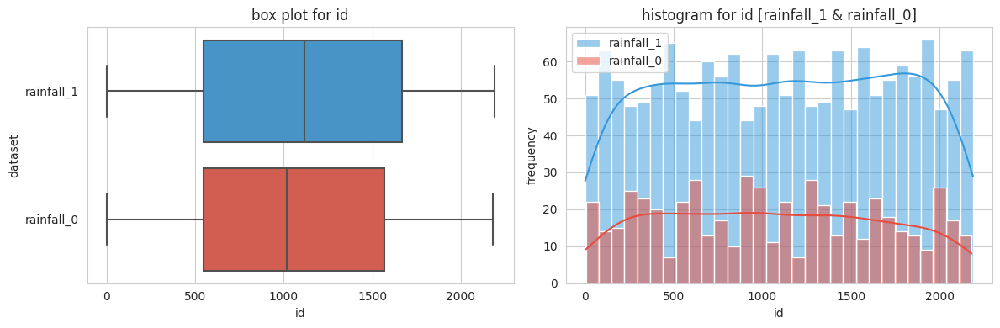

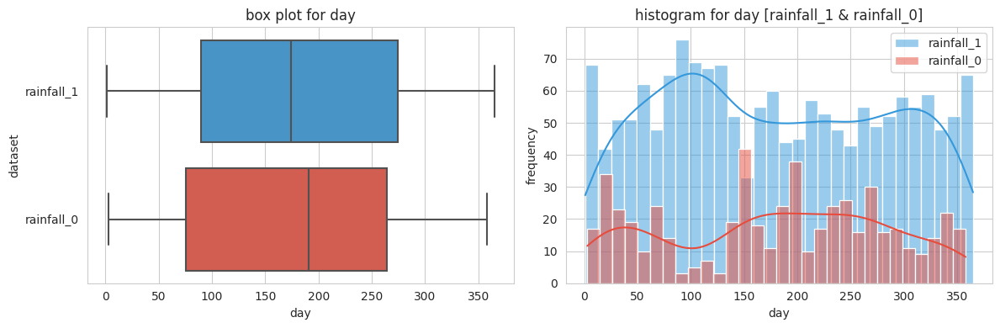

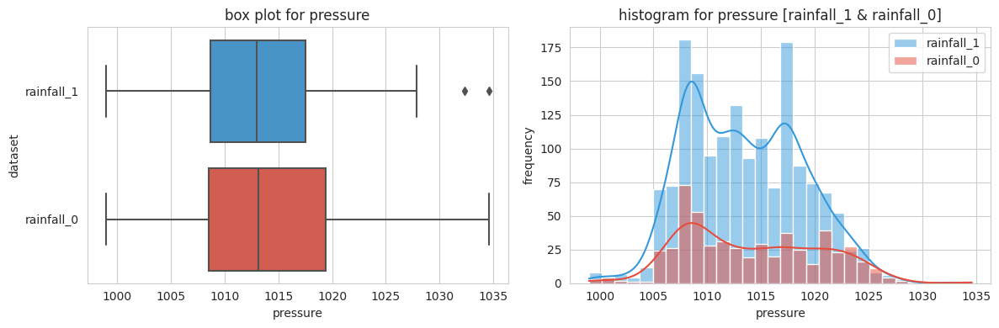

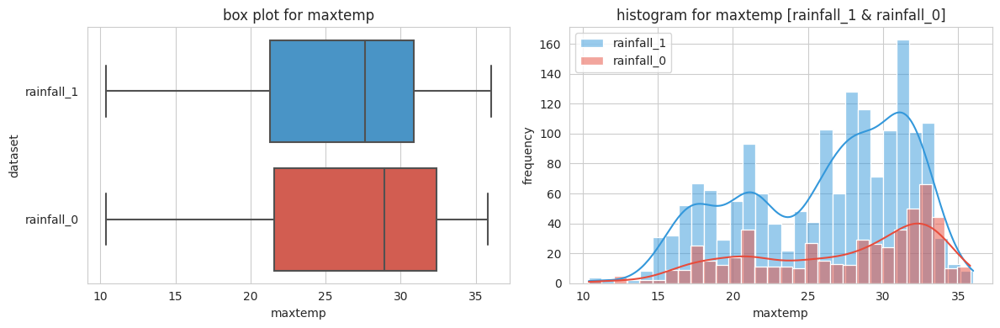

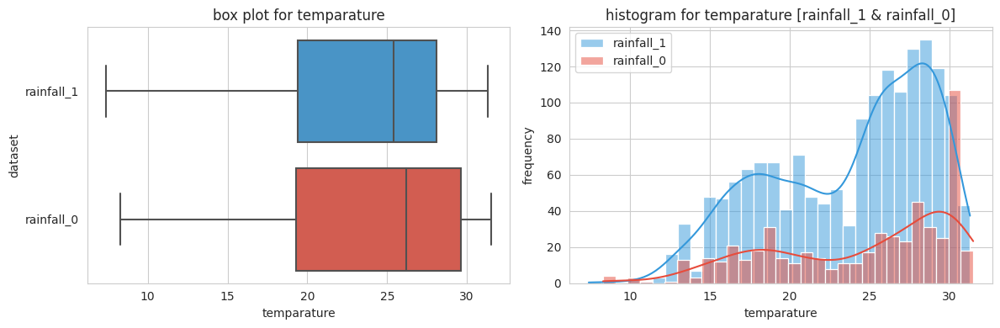

...

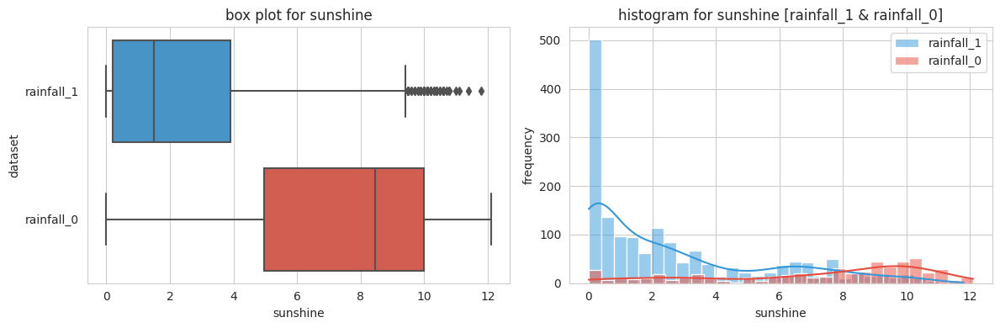

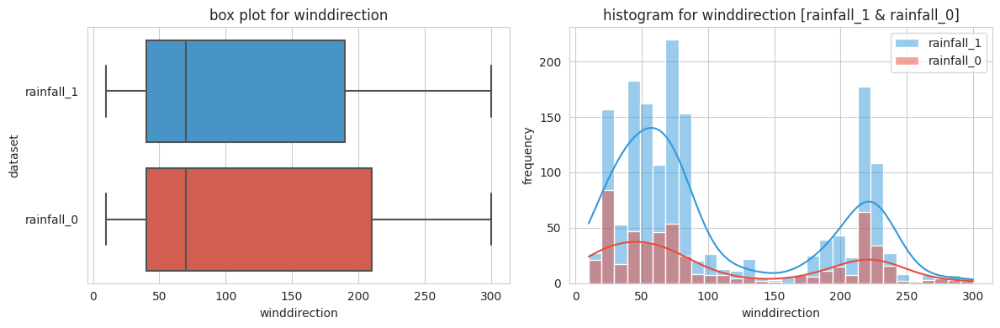

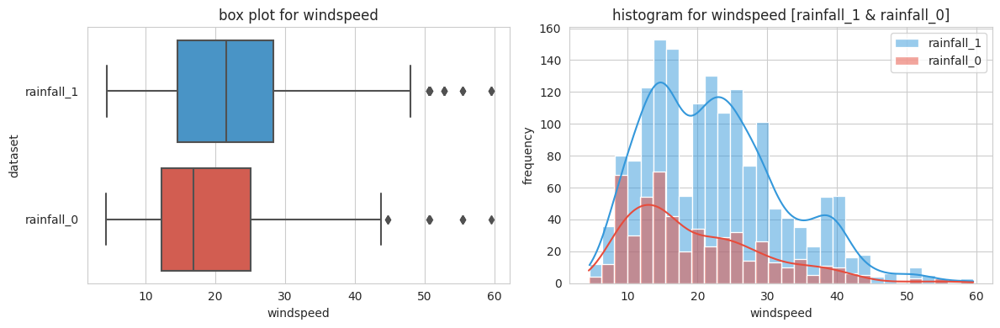

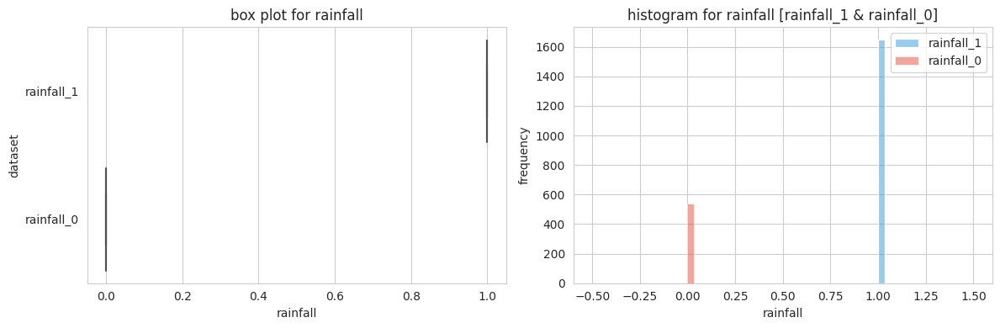

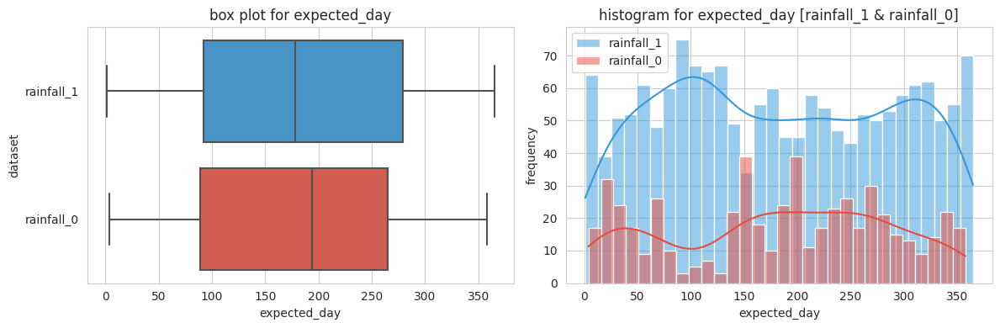

In [24]:
# box plot and histogram

# Define a custom color palette
custom_palette = ['#3498db', '#e74c3c','#2ecc71']

# Add 'Dataset' column to distinguish between train and test data
df_train_rainfall_1['dataset'] = 'rainfall_1'
df_train_rainfall_0['dataset'] = 'rainfall_0'

# Get only numeric variables
numerical_variables = df_train_rainfall_1.select_dtypes(include=['number']).columns

# Function to create and display a row of plots for a single variable
def create_variable_plots(variable):
    sns.set_style('whitegrid')
    
    # Check if variable exists in both df_train_rainfall_1 and df_train_rainfall_0
    if variable in df_train_rainfall_1.columns:
        fig, axes = plt.subplots(1, 2, figsize=(12, 4))

        # Box plot
        plt.subplot(1, 2, 1)
        if variable in df_train_rainfall_0.columns:
            sns.boxplot(data=pd.concat([df_train_rainfall_1, df_train_rainfall_0]), x=variable, y="dataset", palette=custom_palette)
        else:
            sns.boxplot(data=df_train_rainfall_1, x=variable, y="dataset", palette=custom_palette)
        plt.xlabel(variable)
        plt.title(f"box plot for {variable}")

        # Separate Histograms
        plt.subplot(1, 2, 2)
        sns.histplot(data=df_train_rainfall_1, x=variable, color=custom_palette[0], kde=True, bins=30, label="rainfall_1")
        if variable in df_train_rainfall_0.columns:
            sns.histplot(data=df_train_rainfall_0, x=variable, color=custom_palette[1], kde=True, bins=30, label="rainfall_0")
        
        plt.xlabel(variable)
        plt.ylabel("frequency")
        plt.title(f"histogram for {variable} [rainfall_1 & rainfall_0]" if variable in df_train_rainfall_0.columns else f"histogram for {variable} [train]")
        plt.legend()

        # Adjust spacing between subplots
        plt.tight_layout()

        # Show the plots
        plt.show()

# Perform univariate analysis for each variable
for variable in numerical_variables:
    create_variable_plots(variable)

# delete unnecessary column
del df_train_rainfall_1['dataset']
del df_train_rainfall_0['dataset']

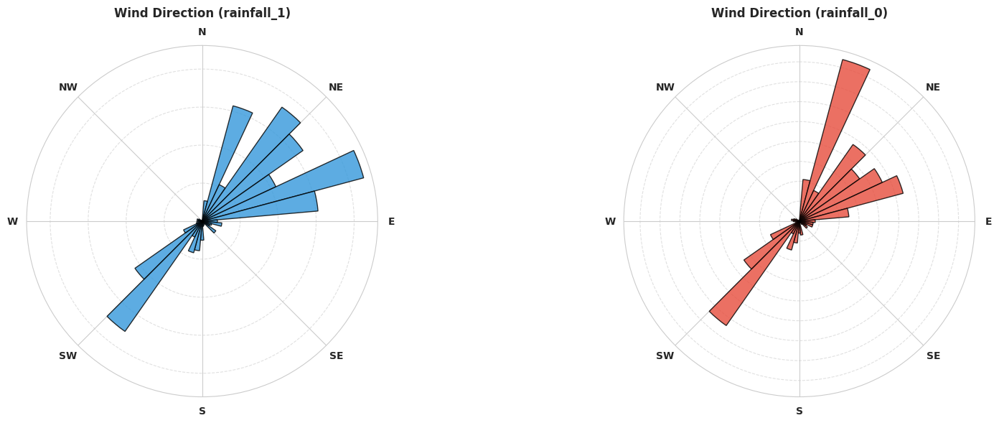

In [25]:
# Define custom color palette for Train, Test, and Original datasets
custom_palette = ['#3498db', '#e74c3c', '#2ecc71']  # Blue, Red, Green

# Function to create Wind Rose plot in a subplot
def create_wind_rose(ax, data, dataset_name, color):
    # Convert wind direction to radians
    wind_direction_radians = np.radians(data['winddirection'].dropna())

    # Create histogram bins (every 10°)
    bins = np.linspace(0, 2*np.pi, 37)  # 36 bins (every 10°)
    counts, bin_edges = np.histogram(wind_direction_radians, bins=bins)

    # Plot on the polar axis with improved style
    bars = ax.bar(bin_edges[:-1], counts, width=np.radians(10), color=color, edgecolor='black', alpha=0.8)

    # Formatting for professional appearance
    ax.set_theta_zero_location("N")  # North is at 0°
    ax.set_theta_direction(-1)  # Clockwise
    ax.set_xticks(np.radians(np.arange(0, 360, 45)))  # Tick labels every 45°
    ax.set_xticklabels(['N', 'NE', 'E', 'SE', 'S', 'SW', 'W', 'NW'], fontsize=10, fontweight='bold')

    # Add grid and labels for better readability
    ax.yaxis.grid(True, linestyle="--", alpha=0.6)
    ax.set_yticklabels([])  # Remove radial labels to avoid clutter
    ax.set_title(f"Wind Direction ({dataset_name})", fontsize=12, fontweight='bold', pad=10)

# Create a single row with three wind rose plots
fig, axes = plt.subplots(1, 2, figsize=(18, 6), subplot_kw={'projection': 'polar'})

# Generate wind rose plots for Train, Test, and Original datasets
create_wind_rose(axes[0], df_train_rainfall_1, "rainfall_1", custom_palette[0])  # Blue
create_wind_rose(axes[1], df_train_rainfall_0, "rainfall_0", custom_palette[1])    # Red

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

### caterogy

## vivariate

### numeric

### category